<a href="https://colab.research.google.com/github/JoaoLucasCorreiaS/DogBreedIdentification/blob/main/DogBreedIdentification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end multi-class dog breed identification

This notebook will use TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem
Identifying a dog breed given an image of a dog.

## 2. Data
The data we're using is from Kaggle's dog breed identification competition.

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

## 4. Features
Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (120 different classes).
* There are about 10,000 images in the training set (these images have labels).
* There are about 10,000 images in the test set (these images have no labels because we'll want to predict them).

In [ ]:
# !unzip "/content/drive/MyDrive/DataScience/DogBreed_ID/dog-breed-identification.zip" -d "/content/drive/MyDrive/DogBreed_ID/"

### Get our workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Makke sure we're using a GPU

In [ ]:
# Import TensorFlow into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

print("GPU", "available (YES!)" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.12.0
TF Hub version: 0.13.0
GPU available (YES!)


## Getting the data ready (turning into tensors)



In [ ]:
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/DataScience/DogBreed_ID/labels.csv")
print(labels_csv.describe())
print("********")
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
********
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
#How many images are there of each breed?

labels_csv["breed"].value_counts()


scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

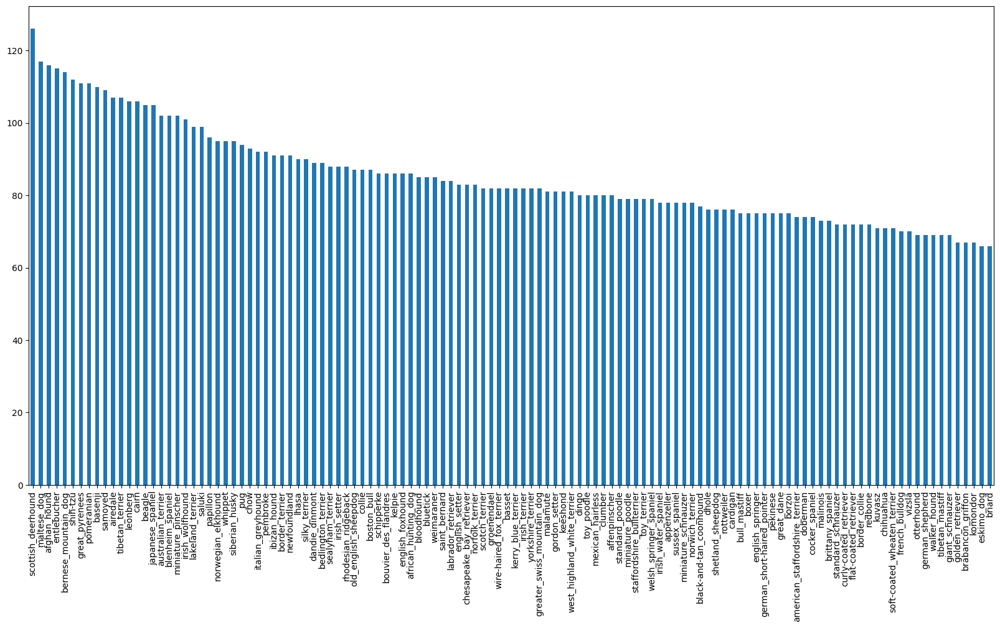

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

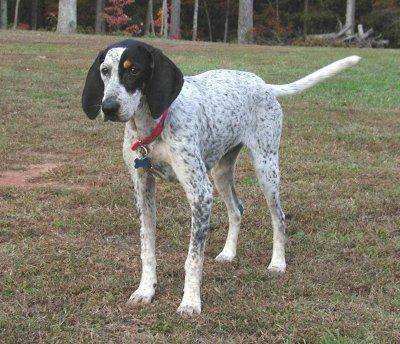

In [ ]:
from IPython.display import Image
# testing ipython
Image("/content/drive/MyDrive/DataScience/DogBreed_ID/train/00214f311d5d2247d5dfe4fe24b2303d.jpg")

### Getting images and their labels

In [ ]:
# Creating pathnames from images ID's
filenames = ["/content/drive/MyDrive/DataScience/DogBreed_ID/train/"+ fname + ".jpg" for fname in labels_csv["id"]]

filenames[:10]

['/content/drive/MyDrive/DataScience/DogBreed_ID/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/DataScience/DogBreed_ID/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/DataScience/DogBreed_ID/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/DataScience/DogBreed_ID/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/DataScience/DogBreed_ID/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/DataScience/DogBreed_ID/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/DataScience/DogBreed_ID/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/DataScience/DogBreed_ID/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/DataScience/DogBreed_ID/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/DataScience/DogBreed_ID/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check if the number os filenames matches the number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/DataScience/DogBreed_ID/train/")) == len(filenames):
  print("Filenames match actual amount of files! Proceed.")
else:
  print("Filenames do not match actual amount of files! Check the target directory.")

Filenames match actual amount of files! Proceed.


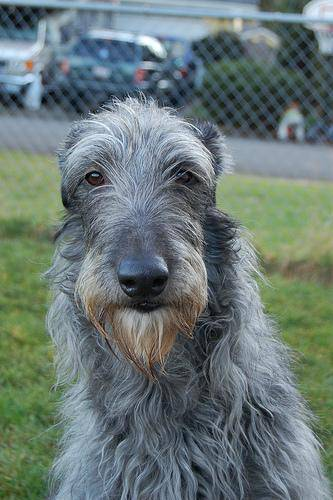

In [ ]:
# One more check: image and its label (dog breed)

Image(filenames[8234])

In [ ]:
labels_csv["breed"][8234]

'scottish_deerhound'

Since I've now got my training image filepaths in a list, let me prepare the labels!

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# See if number os labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches the number of filenames!")
else:
  print("Number of labels does not match the number of filenames. Check data directories!")

Number of labels matches the number of filenames!


In [ ]:
# Find the unique labels values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean arrays
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating my own validation set

Since the dataset from Kaggle doesn't come with a validation set, let's create my own.

In [ ]:
# Setup X & Y variables
X = filenames
Y = boolean_labels

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type: "slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, Y_train, Y_val = train_test_split(X[:NUM_IMAGES], Y[:NUM_IMAGES], test_size=0.2, random_state=42)

len(X_train), len(X_val), len(Y_train), len(Y_val)

(800, 200, 800, 200)

## Preprocessing Images (turning images into Tensors)

To preprocess the images into Tensors, I'm going to write a function wich does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn the `image` (a jpg) into Tensors
4. Normalize the image (convert colour channel from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Retur the modified `image`

Before starting to do this, let me see what importing an image looks like:

In [ ]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
# Turn image into a tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

In [ ]:
 # Define the image size
 IMG_SIZE = 224

# Create a function to preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image filepath and turns the image into a Tensor
  """
  # Read an image file
  image = tf.io.read_file(image_path)
  # Turn the jpg image into numerical Tensor with 3 colour channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 (normalização!!)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning data into batches



In [2]:
# Why turn our data into batches?

# Let's say you're trying to process 10,000+ imagens in one go... they all might not fit into memory! 
# So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust it)
# In order to use TensorFlow effectively, we need our data in the form of Tensor tuples, which look like this:

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [ ]:
# Define the batch size (32 is a good start)
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, Y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and labels (Y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also, accepts test data as input (no labels).
  """
  # If the data is a test dataset, I probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, I don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(Y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  
  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(Y)))
    # Shuffling pathnames and labels before mapping image processor funtion is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, Y_train)
val_data = create_data_batches(X_val, Y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

Data is now in batches, however these can be a little hard to undestand/comprehend. Let me visualize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 x 5)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")


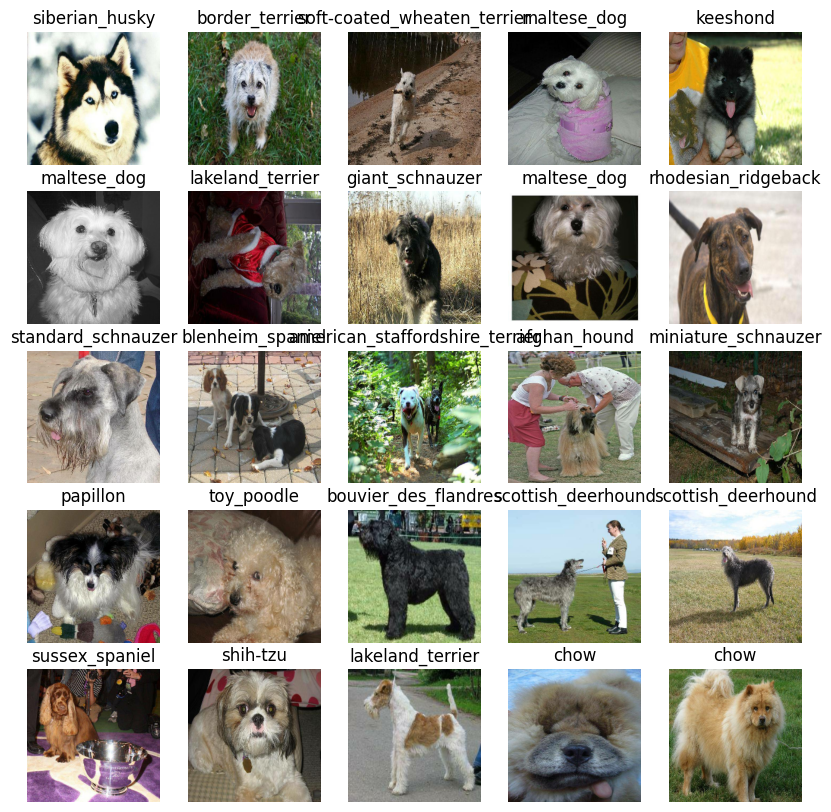

In [ ]:
# Now let'me visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

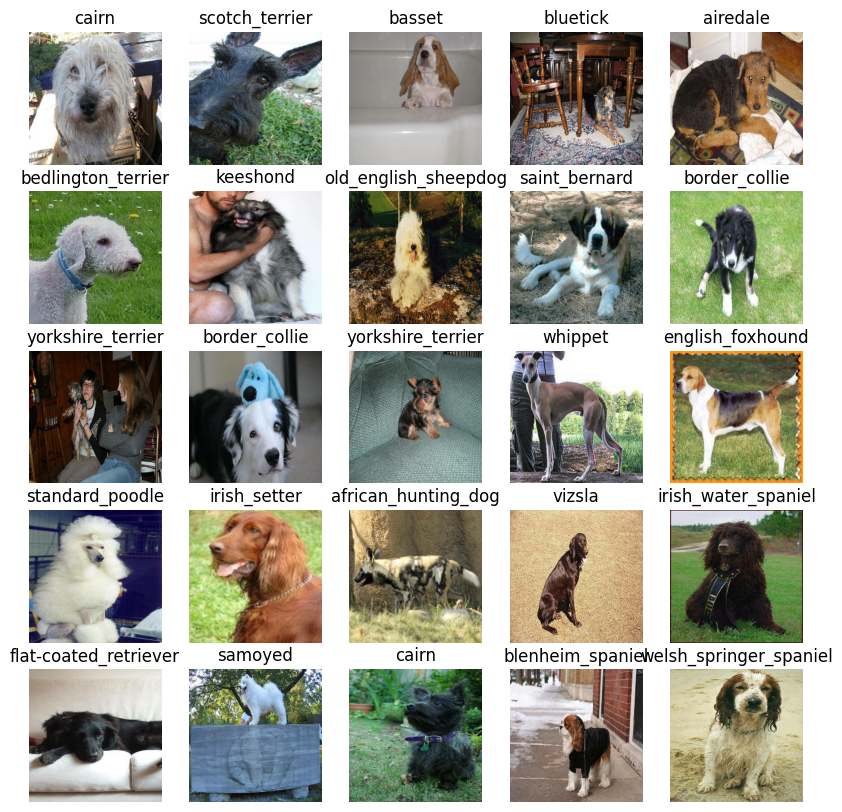

In [ ]:
# Now let'me visualize the validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before starting to build a model, there are a few things I need to define:
* The input shape (our images shape, in the form of tensors) to the model.
* The output shape (images labels, in the form of tensors) of the model.
* The URL of the model I want to use from TensorFlow Hub.

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup URL model from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now I've got the inputs, outputs and model ready to go, let me put'em together into a Keras Deep Learning model!

Knowing this, let me create a function wich:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (layer by layer).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

In [ ]:
# Create a function wich builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
          hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
          tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                activation="softmax") # Layer 2 (output layer)
  ])

# Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

# Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks



In [3]:
# Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop trainig early if a model stops improving.

# I'm going to create two callbacks: one for TensorBoard which helps track the model's progress and another for early stopping which prevents the model from running for too long.

### TensorBoard Callback

To setup a TensorBoard callback, I need to do 3 things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to the model's `fit()` function.
3. Visualize the model's training logs with the `%tensorboard` magic function (I'll do this after model training).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a funtion to build a TensorBoard callback
def create_tensorboard_callback():
  #Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/DataScience/DogBreed_ID/Logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%d%m%Y-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop the model from overfitting by stopping training if a certain evaluation metric stops improving.

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)
The first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type: "slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU", "Available (YES!!!)" if tf.config.list_physical_devices("GPU") else "Not Available")

GPU Available (YES!!!)


Create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* call the `fit()` function on the model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks I'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  model = create_model()
  # create nwe tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()
  # fit the model to the data passing it the callbacks I created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 143s 4s/step - loss: 4.6928 - accuracy: 0.0700 - val_loss: 3.3401 - val_accuracy: 0.2650
Epoch 2/100
25/25 [==============================] - 3s 119ms/step - loss: 1.6894 - accuracy: 0.6650 - val_loss: 2.0671 - val_accuracy: 0.5550
Epoch 3/100
25/25 [==============================] - 3s 120ms/step - loss: 0.5653 - accuracy: 0.9450 - val_loss: 1.5794 - val_accuracy: 0.6500
Epoch 4/100
25/25 [==============================] - 4s 156ms/step - loss: 0.2541 - accuracy: 0.9862 - val_loss: 1.4117 - val_accuracy: 0.6850
Epoch 5/100
25/25 [==============================] - 4s 140ms/step - loss: 0.1487 - accuracy: 0.9987 - val_loss: 1.3353 - val_accuracy: 0.6900
Epoch 6/100
25/25 [==============================] - 4s 149ms/step - loss: 0.1019 - accuracy: 1.0000 - val_loss: 1.2926 - val_accuracy: 0.7000
Epoch 7/100
25/25 [==============================]

**Question:** It looks like the model is overfitting because it's performing far better on the training dataset than the validation dataset. What are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means the model is learning!

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/DataScience/DogBreed_ID/Logs # magic function

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on!)
predictions = model.predict(val_data,
                            verbose=1)
predictions # são 200 vetores de dimensão 120 (número de raças) indicando a probabilidade de o modelo ter acertado do que se trata determinada imagem!

7/7 [==============================] - 5s 144ms/step


array([[7.7338627e-04, 1.1934461e-04, 4.6743601e-04, ..., 4.9449114e-05,
        8.2110208e-05, 7.5005684e-03],
       [6.9291587e-04, 1.0647557e-03, 2.4964387e-02, ..., 1.2530726e-03,
        8.3913747e-03, 2.6505347e-04],
       [1.0041077e-05, 5.2245887e-05, 4.7643425e-05, ..., 1.7080977e-04,
        2.1103218e-04, 8.2183932e-04],
       ...,
       [2.1667593e-06, 3.7258636e-05, 1.9250367e-05, ..., 1.9569599e-05,
        3.9280185e-05, 2.0807327e-05],
       [6.1351112e-03, 1.0984077e-03, 1.0081290e-04, ..., 2.6669042e-04,
        2.0949615e-04, 1.1056749e-02],
       [3.1704984e-03, 1.0267047e-04, 2.7025237e-03, ..., 5.1412038e-03,
        1.1759083e-03, 7.3308067e-04]], dtype=float32)

In [ ]:
predictions.shape, len(Y_val), len(unique_breeds)

((200, 120), 200, 120)

In [ ]:
# First prediction
index = 42 #posso digitar qualquer número aqui!! Este número se refere ao número da imagem que ele está validando!
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[0])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[3.52245232e-04 3.89947119e-04 1.56629132e-04 1.71026928e-04
 5.42170275e-03 2.86470258e-05 1.42653938e-04 4.44165943e-03
 2.53695939e-02 8.46741199e-02 1.01964899e-04 6.21232030e-05
 1.88056275e-03 5.64378966e-03 9.67429485e-04 5.53162629e-03
 3.67968460e-05 2.79204454e-04 6.96655770e-04 6.69645378e-04
 1.83806496e-05 7.33460416e-04 1.53618181e-04 2.22854389e-04
 2.25120671e-02 1.53294750e-04 1.70903986e-05 1.80551302e-04
 4.63328324e-04 6.38584097e-05 1.33156849e-04 2.78249499e-04
 1.50796579e-04 8.68751813e-05 2.59525172e-04 4.77042922e-05
 3.39037273e-04 2.10981816e-04 8.61116932e-05 3.87438565e-01
 3.95645999e-04 4.26160223e-05 1.17629347e-02 1.89546026e-05
 2.17221721e-04 9.49928071e-05 4.61674965e-04 2.64287367e-03
 5.30719662e-05 1.05356192e-03 1.20475604e-04 3.46065906e-04
 1.26141458e-04 2.60589644e-03 3.69645459e-05 1.49087713e-03
 1.01653382e-03 1.45452686e-05 1.90492156e-05 8.08327532e-05
 1.15141207e-04 2.62622081e-04 3.49048128e-06 1.53750239e-04
 2.19528287e-04 1.361107

Having the above functionality is great, but I want to be able to do it at scale.

And it would be even better if I could see the image the prediction is being made on!

**Note:** Prediction probabilities are also know as confidence levels!

In [ ]:
# Turne probabilities into theis respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

Now, since the validation data is still in a batch dataset, I'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) tensors and returs separate arrays of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now I've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some functions to make these all a bit more visual.

I'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                     np.max(pred_prob)*100,
                                     true_label),
                                     color=color)


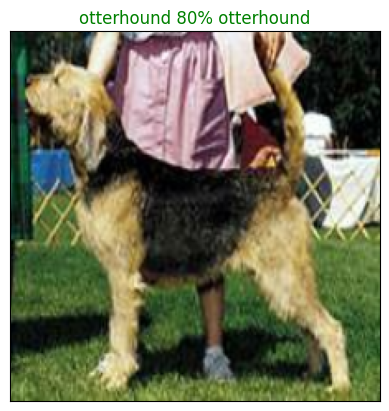

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=151)

Now I've got one function to visualize the model's top prediction, let's make another to view our model top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change the colour of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

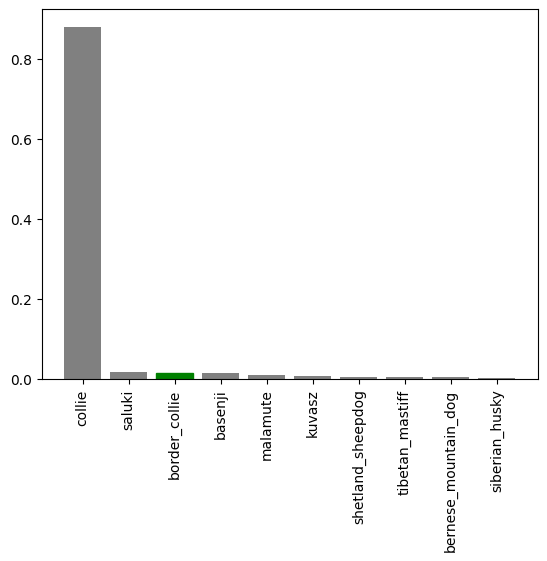

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
              labels=val_labels,
              n=9)

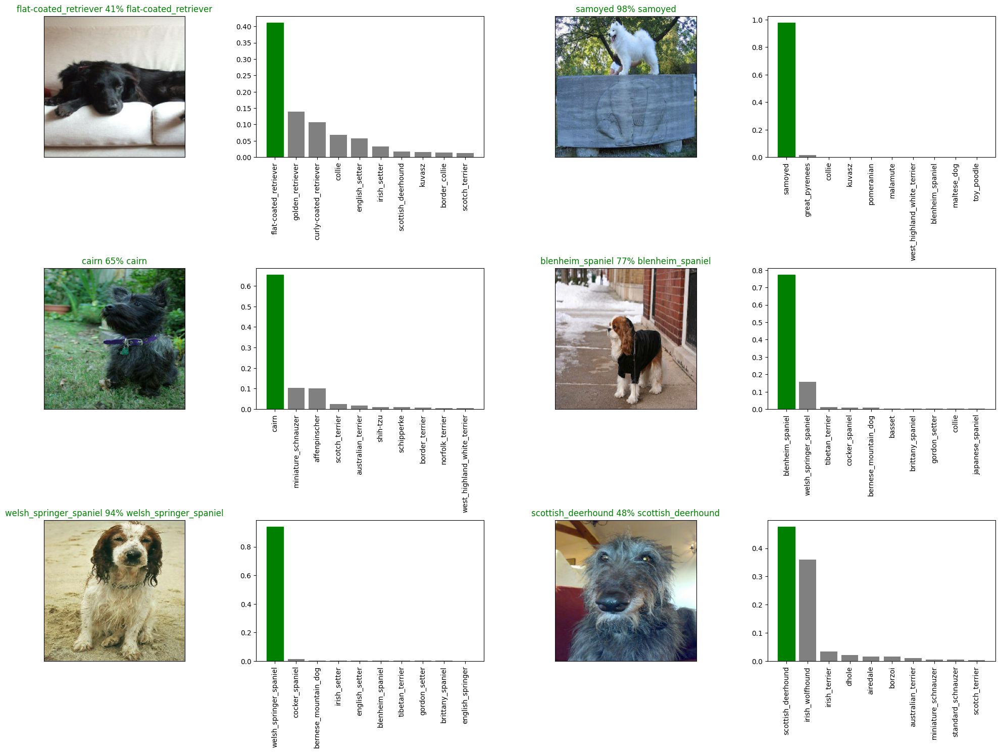

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20 #modifica a entrada!
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0) #para os nomes do eixo-x não serem cortados
plt.show()

# Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  modeldir = os.path.join("drive/MyDrive/DataScience/DogBreed_ID/Models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" #h5 é a extensão do arquivo!
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a funtion to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}...")
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/DataScience/DogBreed_ID/Models/20230404-18231680632599-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/DataScience/DogBreed_ID/Models/20230404-18231680632599-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/DataScience/DogBreed_ID/Models/20230227-17531677520382-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/DataScience/DogBreed_ID/Models/20230227-17531677520382-1000-images-mobilenetv2-Adam.h5...


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 80ms/step - loss: 1.2334 - accuracy: 0.6950


[1.2333728075027466, 0.6949999928474426]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 98ms/step - loss: 1.2279 - accuracy: 0.6650


[1.227867841720581, 0.6650000214576721]

# Training a huge model on all the images! (FULL DATA!!!!)

In [ ]:
len(X), len(Y), len(X_train)

(10222, 10222, 800)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, Y)
full_data

Creating training data batches...


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# There's no validation set when training all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

**AVISO:** Rodar a célula abaixo pode demorar (algo em torno de 30min para o primeiro EPOCH) pq a GPU que estamos usando para executar deverá carregar TODAS as imagens na memória!

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 39s 106ms/step - loss: 1.3191 - accuracy: 0.6731
Epoch 2/100
320/320 [==============================] - 34s 107ms/step - loss: 0.3946 - accuracy: 0.8858
Epoch 3/100
320/320 [==============================] - 33s 104ms/step - loss: 0.2324 - accuracy: 0.9355
Epoch 4/100
320/320 [==============================] - 33s 104ms/step - loss: 0.1498 - accuracy: 0.9657
Epoch 5/100
320/320 [==============================] - 34s 105ms/step - loss: 0.1068 - accuracy: 0.9772
Epoch 6/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0755 - accuracy: 0.9884
Epoch 7/100
320/320 [==============================] - 33s 103ms/step - loss: 0.0593 - accuracy: 0.9913
Epoch 8/100
320/320 [==============================] - 34s 105ms/step - loss: 0.0453 - accuracy: 0.9946
Epoch 9/100
320/320 [==============================] - 34s 107ms/step - loss: 0.0377 - accuracy: 0.9957
Epoch 10/100
320/320 [==============================] - 34s 106m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/DataScience/DogBreed_ID/Models/20230404-18381680633489-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/DataScience/DogBreed_ID/Models/20230404-18381680633489-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model("drive/MyDrive/DataScience/DogBreed_ID/Models/20230227-19001677524445-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/DataScience/DogBreed_ID/Models/20230227-19001677524445-full-image-set-mobilenetv2-Adam.h5...


## Making predictions on the test dataset
Since the model has been trained on images in the form of Tensor batches, to make predictions on the test data, I'll have to get it into the same format.

I created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, I'll:
* Get the test image filenames;
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data has no labels);
* Make a predicions array by passing the test batches to the `predict()` method called on the model.

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/DataScience/DogBreed_ID/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/DataScience/DogBreed_ID/test/e278b2f68fa5d146e0bf06eee5faa0e3.jpg',
 'drive/MyDrive/DataScience/DogBreed_ID/test/dce09c7574fbbe57f39606daf32e5445.jpg',
 'drive/MyDrive/DataScience/DogBreed_ID/test/df2a003a0b1a216effd806f03f703859.jpg',
 'drive/MyDrive/DataScience/DogBreed_ID/test/e334f758c7944df19c98d49498d28c64.jpg',
 'drive/MyDrive/DataScience/DogBreed_ID/test/e1a777d181483b0982732fa4128df7f8.jpg',
 'drive/MyDrive/DataScience/DogBreed_ID/test/e0a6b866af64299ecf76f7cb11c80674.jpg',
 'drive/MyDrive/DataScience/DogBreed_ID/test/de59703200e1b19b520033e76dea9b62.jpg',
 'drive/MyDrive/DataScience/DogBreed_ID/test/e379ba26a5e2e22e85975b839e0e401b.jpg',
 'drive/MyDrive/DataScience/DogBreed_ID/test/e01b6b1e7cef1d9abdfbeb4afb88379f.jpg',
 'drive/MyDrive/DataScience/DogBreed_ID/test/e380bd4f8375d09ae72f4f36aa610031.jpg']

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 162s 484ms/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/DataScience/DogBreed_ID/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.58742703e-02, 1.58410949e-05, 2.26836372e-09, ...,
        5.84595957e-12, 1.14812760e-11, 9.10595596e-01],
       [8.62885596e-10, 3.45410896e-12, 4.69349950e-12, ...,
        1.17878884e-12, 2.08403225e-11, 3.56869123e-07],
       [4.10754243e-11, 2.38679218e-06, 2.89985674e-11, ...,
        2.49578913e-10, 6.46783625e-13, 1.59154113e-11],
       ...,
       [1.16690303e-11, 2.09997154e-14, 6.42280109e-12, ...,
        1.09512148e-11, 7.53233309e-10, 2.31148212e-09],
       [6.78639978e-10, 4.64438177e-09, 1.15242549e-09, ...,
        7.45800643e-11, 2.39170541e-11, 7.25120186e-09],
       [1.11114664e-08, 1.02864924e-07, 5.87133497e-09, ...,
        4.66380321e-08, 2.29079542e-05, 3.52181502e-07]], dtype=float32)

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

O arquivo .csv deve conter a primeira coluna com as ID's e as próximas colunas como sendo as raças dos cães, sendo que cada linha deverá conter a probabilidade de acerto para a respectiva coluna e ID.
Veja em https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation



In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["ID"] + list(unique_breeds))
preds_df.head()

,ID,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)] # o índice [0] retira a segunda parte do nome do arquivo (sua extensão)
test_ids[:3]

['e278b2f68fa5d146e0bf06eee5faa0e3',
 'dce09c7574fbbe57f39606daf32e5445',
 'df2a003a0b1a216effd806f03f703859']

In [ ]:
preds_df["ID"] = test_ids
preds_df.head()

,ID,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e278b2f68fa5d146e0bf06eee5faa0e3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dce09c7574fbbe57f39606daf32e5445,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,df2a003a0b1a216effd806f03f703859,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e334f758c7944df19c98d49498d28c64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e1a777d181483b0982732fa4128df7f8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,ID,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e278b2f68fa5d146e0bf06eee5faa0e3,1.587427e-02,1.584109e-05,2.268364e-09,8.838621e-11,6.997824e-14,1.335342e-13,3.990052e-08,8.068778e-10,4.533948e-11,...,2.639660e-07,3.433999e-10,2.494847e-10,1.855946e-07,1.220548e-09,1.659002e-08,3.463201e-08,5.845960e-12,1.148128e-11,9.105956e-01
1,dce09c7574fbbe57f39606daf32e5445,8.628856e-10,3.454109e-12,4.693499e-12,8.103953e-11,5.891174e-10,5.983090e-14,7.682257e-12,1.722190e-14,4.229700e-11,...,1.308526e-08,9.747376e-12,9.456508e-09,5.640372e-11,3.031129e-10,8.177579e-12,1.231805e-11,1.178789e-12,2.084032e-11,3.568691e-07
2,df2a003a0b1a216effd806f03f703859,4.107542e-11,2.386792e-06,2.899857e-11,5.156855e-09,4.097087e-12,1.687985e-06,3.650313e-12,3.297552e-11,1.337352e-08,...,1.251854e-09,1.887352e-13,2.819722e-08,1.025898e-08,3.025858e-08,3.037061e-10,1.362405e-09,2.495789e-10,6.467836e-13,1.591541e-11
3,e334f758c7944df19c98d49498d28c64,1.374112e-06,3.621035e-10,4.008635e-09,2.735759e-09,2.378652e-08,6.361242e-09,1.247439e-05,2.423791e-08,4.032130e-07,...,3.921181e-04,6.815765e-07,2.196651e-07,8.455356e-09,1.670590e-08,4.961476e-10,2.415773e-05,3.488438e-10,2.783451e-05,1.501086e-07
4,e1a777d181483b0982732fa4128df7f8,1.758433e-10,1.820893e-11,8.909307e-09,1.734616e-09,2.140229e-07,4.497719e-11,2.072918e-05,1.449219e-08,2.828828e-09,...,1.076302e-08,4.534152e-08,8.266286e-09,4.606771e-10,3.273524e-11,4.035031e-10,1.413455e-07,3.937241e-09,2.029203e-08,9.794520e-07


In [ ]:
preds_df.to_csv("drive/MyDrive/DataScience/DogBreed_ID/ExportedFiles/full_model_predictions_submission1.csv", index=False)

## Making predictions on custom images

To make predictions os custom images, I'll:
* Get the filepaths or our images;
* Turn the filepaths into data batches using `create_data_batches()`. And since my custom images won't have labels, I'll set the `test_data` parameter to `True`;
* Pass the custom image data batch to the model's `predict()` method;
* Convert the prediction output probabilities to predictions labels;
* Compare the predicted label to the custom images.

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/DataScience/DogBreed_ID/MyImages/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['drive/MyDrive/DataScience/DogBreed_ID/MyImages/Queen01.jpeg',
 'drive/MyDrive/DataScience/DogBreed_ID/MyImages/Queen02.jpeg',
 'drive/MyDrive/DataScience/DogBreed_ID/MyImages/Queen03.jpeg',
 'drive/MyDrive/DataScience/DogBreed_ID/MyImages/Queen05.jpeg',
 'drive/MyDrive/DataScience/DogBreed_ID/MyImages/Queen04.jpeg',
 'drive/MyDrive/DataScience/DogBreed_ID/MyImages/sample1.jpg',
 'drive/MyDrive/DataScience/DogBreed_ID/MyImages/sample10.jpg',
 'drive/MyDrive/DataScience/DogBreed_ID/MyImages/sample8.jpg',
 'drive/MyDrive/DataScience/DogBreed_ID/MyImages/sample4.jpg',
 'drive/MyDrive/DataScience/DogBreed_ID/MyImages/sample6.jpg',
 'drive/MyDrive/DataScience/DogBreed_ID/MyImages/sample5.jpg',
 'drive/MyDrive/DataScience/DogBreed_ID/MyImages/sample2.jpg',
 'drive/MyDrive/DataScience/DogBreed_ID/MyImages/sample3.jpg',
 'drive/MyDrive/DataScience/DogBreed_ID/MyImages/sample9.jpg',
 'drive/MyDrive/DataScience/DogBreed_ID/MyImages/sample7.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on custom data
custom_preds = loaded_full_model.predict(custom_data)
custom_preds.shape

1/1 [==============================] - 4s 4s/step


(15, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['maltese_dog',
 'maltese_dog',
 'lhasa',
 'maltese_dog',
 'maltese_dog',
 'golden_retriever',
 'golden_retriever',
 'german_shepherd',
 'pembroke',
 'golden_retriever',
 'great_pyrenees',
 'labrador_retriever',
 'golden_retriever',
 'golden_retriever',
 'golden_retriever']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []

# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

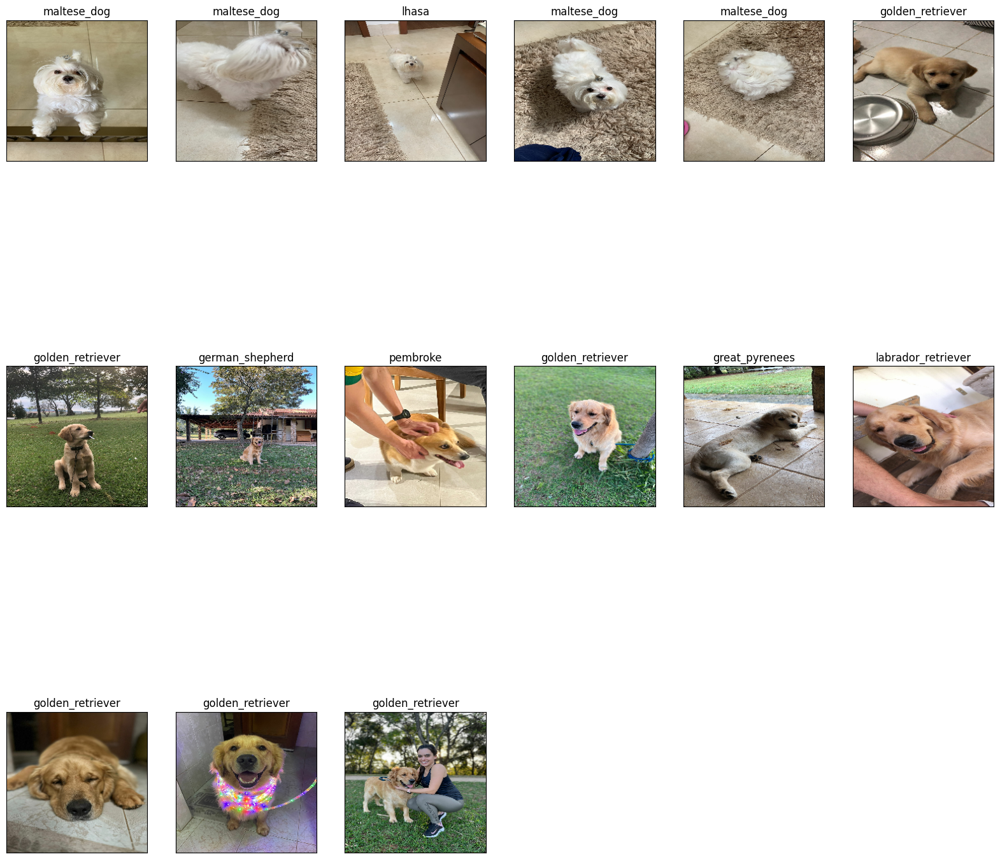

In [ ]:
# Check custom images predictions
plt.figure(figsize=(20,20))
for i, image in enumerate(custom_images):
  plt.subplot(3, 6, i+1) # o "15" está aqui pq temos 15 fotografias na pasta My_Images
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)